**Sentimental Analysis Using Transformers Project - NLP Project**

**Done By: Ashwath Bala S**

**Table of Contents:**

1. Importing the Required Libraries

2. Loading the Dataset

3. Loading the Tokenizer and Model

4. Tokenizing the Dataset

5. Preparing the DataLoader

6. Model Training

7. Model Testing

8. Explainability using SHAP

9. Visualization using Weights and Bias API

10. Saving the Model for Reusability

11. Model Pipeline

**1.Importing the Required Libraries**

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os
import torch
import pandas as pd
import transformers
import shap
import wandb
from datasets import load_dataset
from transformers import AutoTokenizer, AutoModelForSequenceClassification,TrainingArguments, Trainer
from torch.utils.data import DataLoader
from transformers.integrations import WandbCallback
from transformers import pipeline

2024-07-09 05:49:25.828450: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-09 05:49:25.828591: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-09 05:49:25.946496: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


**2. Loading the Dataset**

In [2]:
dataset = load_dataset('imdb')

Generating train split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating unsupervised split:   0%|          | 0/50000 [00:00<?, ? examples/s]

In [40]:
type(dataset)

datasets.dataset_dict.DatasetDict

In [4]:
# Printing keys (indexes)
print(dataset.keys())

dict_keys(['train', 'test', 'unsupervised'])


In [5]:
# Accessing the 'train' split
imdb_train = dataset['train']

# Converting to pandas DataFrame
df = pd.DataFrame(imdb_train)

# Getting top 5 rows
top_5_rows = df.head()

# Printing top 5 rows
print(top_5_rows)

                                                text  label
0  I rented I AM CURIOUS-YELLOW from my video sto...      0
1  "I Am Curious: Yellow" is a risible and preten...      0
2  If only to avoid making this type of film in t...      0
3  This film was probably inspired by Godard's Ma...      0
4  Oh, brother...after hearing about this ridicul...      0


In [6]:
# Checking the size of each split
train_rows = len(dataset['train'])
test_rows = len(dataset['test'])

# Printing the sizes
print(f"Number of samples in the training set: {train_rows}")
print(f"Number of samples in the test set: {test_rows}")

Number of samples in the training set: 25000
Number of samples in the test set: 25000


**3. Loading the Tokenizer and Model**

In [7]:
tokenizer = AutoTokenizer.from_pretrained("textattack/albert-base-v2-imdb")
model = AutoModelForSequenceClassification.from_pretrained("textattack/albert-base-v2-imdb")

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/727 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/760k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/46.7M [00:00<?, ?B/s]

**4. Tokenizing the Dataset**

In [9]:
# Defining the tokenization function
def tokenize(examples):
    # Tokenizing the texts
    tokenized_inputs = tokenizer(examples['text'], padding="max_length", truncation=True)
    return tokenized_inputs

In [10]:
# Tokenizing train dataset
tokenized_train_dataset = dataset['train'].map(tokenize, batched=True)
tokenized_train_dataset = tokenized_train_dataset.remove_columns(["text"])
tokenized_train_dataset = tokenized_train_dataset.rename_column("label", "labels")
tokenized_train_dataset.set_format("torch")

Map:   0%|          | 0/25000 [00:00<?, ? examples/s]

In [11]:
# Tokenizing test dataset
tokenized_test_dataset = dataset['test'].map(tokenize, batched=True)
tokenized_test_dataset = tokenized_test_dataset.remove_columns(["text"])
tokenized_test_dataset = tokenized_test_dataset.rename_column("label", "labels")
tokenized_test_dataset.set_format("torch")

Map:   0%|          | 0/25000 [00:00<?, ? examples/s]

In [12]:
# Verifying the tokenized dataset
print(tokenized_train_dataset[:5])

{'labels': tensor([0, 0, 0, 0, 0]), 'input_ids': tensor([[    2,    31, 13676,  ...,     0,     0,     0],
        [    2,    13,     7,  ...,     0,     0,     0],
        [    2,   100,   104,  ...,     0,     0,     0],
        [    2,    48,   171,  ...,     0,     0,     0],
        [    2,  1962,    15,  ...,     9,     1,     3]]), 'token_type_ids': tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]]), 'attention_mask': tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 1, 1, 1]])}


**5. Preparing the DataLoader**

In [13]:
# Defining the batch size
batch_size = 16

# Creating data loaders for training and test datasets
train_dataloader = DataLoader(tokenized_train_dataset, batch_size=32, shuffle=True, pin_memory=True)
test_dataloader = DataLoader(tokenized_test_dataset, batch_size=64, pin_memory=True)

# Printing the sizes of the datasets for verification
print(f"Number of samples in the training set: {len(train_dataloader.dataset)}")
print(f"Number of samples in the test set: {len(test_dataloader.dataset)}")

Number of samples in the training set: 25000
Number of samples in the test set: 25000


**6. Model Training**

In [16]:
# Initializing WandB
wandb.init(project='Sentimental Analysis using Transformer Project')

In [17]:
# Defining the TrainingArguments
training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=3,  
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=64,  
    learning_rate=2e-5,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=100,
    report_to='wandb',  # Reporting to wandb
    gradient_accumulation_steps=2,
    fp16=True,
)

In [18]:
# Creating a Trainer instance
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataloader.dataset,  
    eval_dataset=test_dataloader.dataset,    
)

# Training the model
trainer.train()

wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.


Step,Training Loss
100,0.084600
200,0.077500
300,0.089600
400,0.089800
500,0.115500
600,0.124400
700,0.124100
800,0.117300
900,0.076500
1000,0.099500


TrainOutput(global_step=2343, training_loss=0.07269820747749957, metrics={'train_runtime': 4430.0511, 'train_samples_per_second': 16.93, 'train_steps_per_second': 0.529, 'total_flos': 1791401707929600.0, 'train_loss': 0.07269820747749957, 'epoch': 2.998080614203455})

**7. Model Testing**

In [19]:
# Evaluating the model on the test dataset
results = trainer.evaluate()

# Extracting metrics
eval_loss = results['eval_loss']

# Printing evaluation metrics
print(f"Eval Loss: {eval_loss}")

Eval Loss: 0.38143280148506165


**8. Explainability using SHAP**

In [21]:
# Let's Build a Pipeline Object to do predictions

pred = transformers.pipeline(
    "text-classification",
    model=model,
    tokenizer=tokenizer,
    device=0,
    return_all_scores=True,
)

In [22]:
# Creating an explainer for the pipeline

explainer = shap.Explainer(pred)

In [23]:
# Computing the SHAP values

shap_values = explainer(dataset["train"][:3])

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|█████     | 1/2 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 3it [00:25,  5.31s/it]               

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 4it [00:32, 10.87s/it]


In [24]:
# Visualizing the impact on all the output classes

shap.plots.text(shap_values)

In [25]:
# Explaining the log odds instead of the probabilities

logit_explainer = shap.Explainer(shap.models.TransformersPipeline(pred, rescale_to_logits=True))

logit_shap_values = logit_explainer(dataset["train"][:3])
shap.plots.text(logit_shap_values)

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|█████     | 1/2 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 3it [00:22,  5.29s/it]               

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 4it [00:29,  9.86s/it]


**10. Visualization using Weights and Biases API**

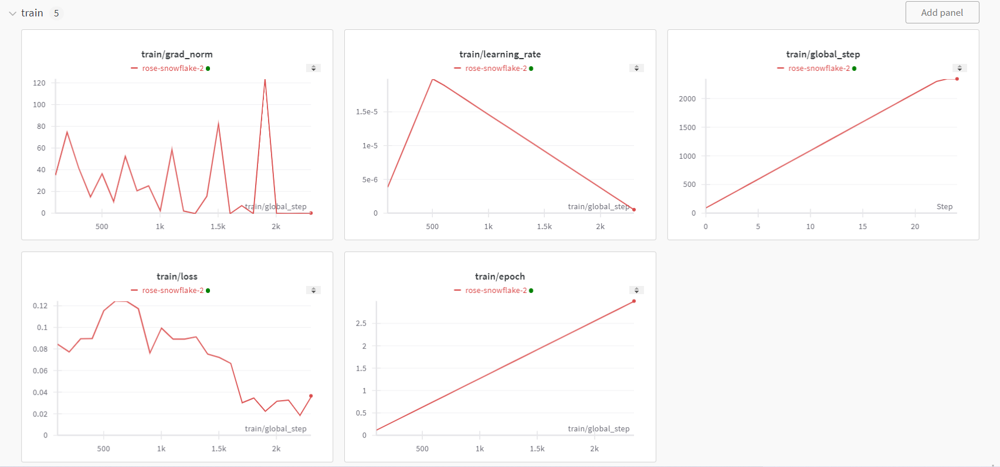

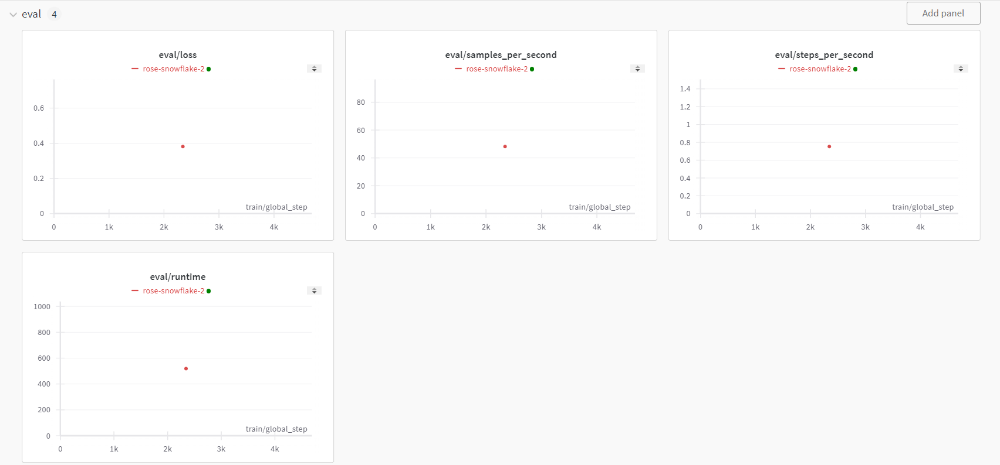

**11. Saving the Model for Reusability**

Let's check if any directory is available to save our model

In [26]:
ls ./saved_model

ls: cannot access './saved_model': No such file or directory


Let's create a Directory to Save our Model

In [27]:
save_directory = './saved_model'

# Creating the directory if it doesn't exist
if not os.path.exists(save_directory):
    os.makedirs(save_directory)

In [28]:
# Saving the Model and the Tokenizer
model.save_pretrained(save_directory)
tokenizer.save_pretrained(save_directory)

('./saved_model/tokenizer_config.json',
 './saved_model/special_tokens_map.json',
 './saved_model/spiece.model',
 './saved_model/added_tokens.json',
 './saved_model/tokenizer.json')

In [29]:
# Verifying the directory structure
print(os.listdir(save_directory))

['spiece.model', 'model.safetensors', 'config.json', 'special_tokens_map.json', 'tokenizer.json', 'tokenizer_config.json']


For Reusability, we will be using the below code to load the trained model

In [30]:
# Loading the model
model = AutoModelForSequenceClassification.from_pretrained('./saved_model')

# Loading the tokenizer
tokenizer = AutoTokenizer.from_pretrained('./saved_model')

**10. Model Pipeline**

In [31]:
# Defining the pipeline for sentiment analysis
classifier = pipeline(
    task="sentiment-analysis",
    model=model,
    tokenizer=tokenizer,
    framework="pt", 
)

In [33]:
# Let's go through an Example
text = "This movie was really great!"
result = classifier(text)

print(result)

[{'label': 'LABEL_1', 'score': 0.9911735653877258}]


In [39]:
# Let's go through an Example of Negative Sentiment
text = "The food at the nearby hotel was very poor!"
result = classifier(text)

print(result)

[{'label': 'LABEL_0', 'score': 0.9809596538543701}]


**In this "Sentimental Analysis Using Transformers Project - NLP Project", we utilized the ALBERT (A Lite Bidirectional Encoder Representations from Transformers) model with the IMDB dataset from the HuggingFace library. We have implemented tokenization prior to model building, visualized the model results using the SHAP library, Weights & Bias API, and finally implemented a pipeline to classify sentiments**